In [1]:
# reload all modules every time before executing
%load_ext autoreload
%autoreload 2

In [61]:
import os, json, re

import torch
import modal
import numpy as np
from PIL import Image, ImageDraw
from scipy.ndimage import center_of_mass

In [72]:
# sample_path = 'Q:\mark_sheinin_lab\DATA\experiment-08\empty_1000--29-03-12-19-27'
# sample_path = 'Q:\DATA\Eitan\experiment_02\circle-position1-openbox-00--07-01-16-16-09'
sample_path = 'Q:\mark_sheinin_lab\DATA\experiment-09\gun_1000--29-03-15-09-31'

<>:3: SyntaxWarning: invalid escape sequence '\m'
<>:3: SyntaxWarning: invalid escape sequence '\m'
C:\Users\eitanturok\AppData\Local\Temp\ipykernel_12604\3635393337.py:3: SyntaxWarning: invalid escape sequence '\m'
  sample_path = 'Q:\mark_sheinin_lab\DATA\experiment-09\gun_1000--29-03-15-09-31'


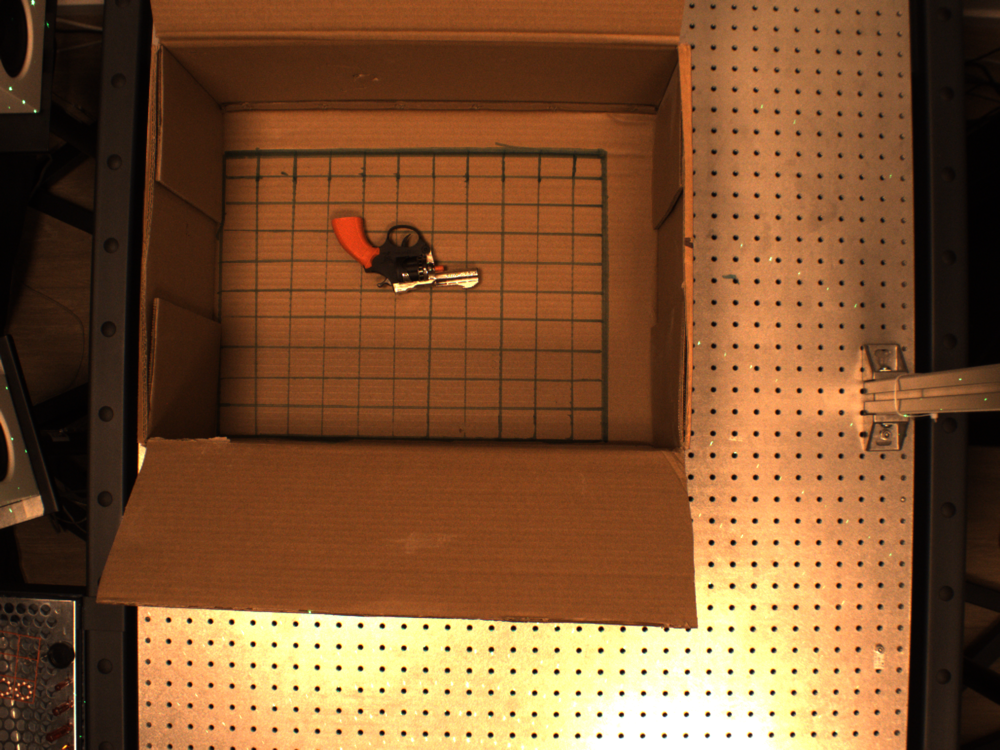

In [73]:
raw_image = Image.open(os.path.join(sample_path, "box_overhead_image.png"))
raw_image

In [74]:
def crop_image(image, left=0, right=1, up=0, down=1):
    W, H = image.size
    x1, x2 = int(W * left), int(W * right)
    y1, y2 = int(H * up), int(H * down)
    return image.crop((x1, y1, x2, y2))

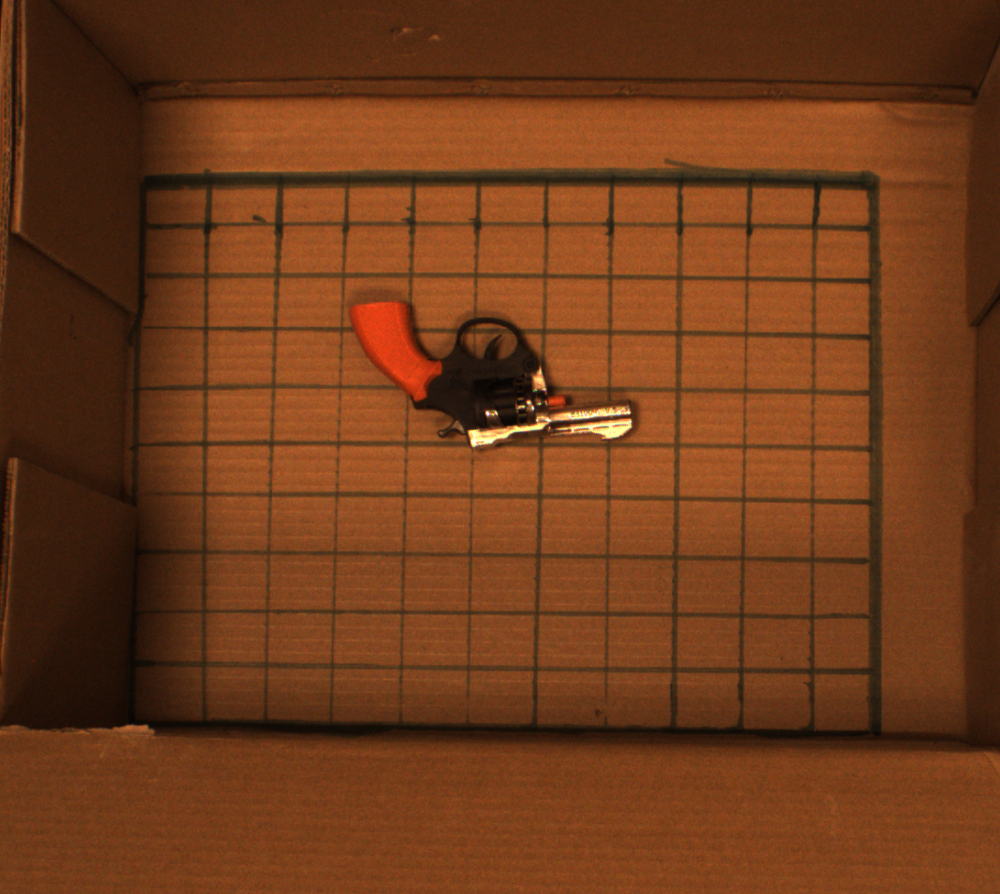

In [75]:
cropped_image = crop_image(raw_image, left=0.15, right=0.67, up=0.08, down=0.7)
cropped_image

In [76]:
app = modal.App("segment")

image = (
    modal.Image.from_registry("nvidia/cuda:12.8.0-devel-ubuntu22.04", add_python="3.12")
    .entrypoint([])
    .apt_install("git")
    .uv_sync(uv_project_dir="../")
)

In [77]:
@app.function(gpu="A10G", image=image, secrets=[modal.Secret.from_name("huggingface")])
def segment(image, object):
    from sam3.model_builder import build_sam3_image_model
    from sam3.model.sam3_image_processor import Sam3Processor

    model = build_sam3_image_model()
    processor = Sam3Processor(model)

    processor.set_confidence_threshold(0.0)
    state = processor.set_image(Image.fromarray(image))
    prompt = f"A {object} inside an open cardboard box from a bird's eye view."
    out = processor.set_text_prompt(state=state, prompt=prompt)

    # Pick top-1 by score
    n = len(out["scores"])
    if n > 1:
        idx = out["scores"].topk(1).indices
        out["masks"]  = out["masks"][idx]
        out["boxes"]  = out["boxes"][idx]
        out["scores"] = out["scores"][idx]

    print(f"detections: {min(1, n)}")
    print(f"scores:     {out['scores'].tolist()}")
    print(f"boxes:      {out['boxes'].tolist()}")

    mask = out["masks"][:, 0].any(dim=0)  # (H', W') BoolTensor

    overlay = np.zeros((*mask.shape, 4), dtype=np.float32)
    overlay[mask.cpu().numpy()] = (0.0, 0.8, 0.2, 0.5)

    return mask.cpu().numpy(), overlay

In [81]:
with app.run():
    mask, overlay = segment.remote(np.array(cropped_image), "gun")

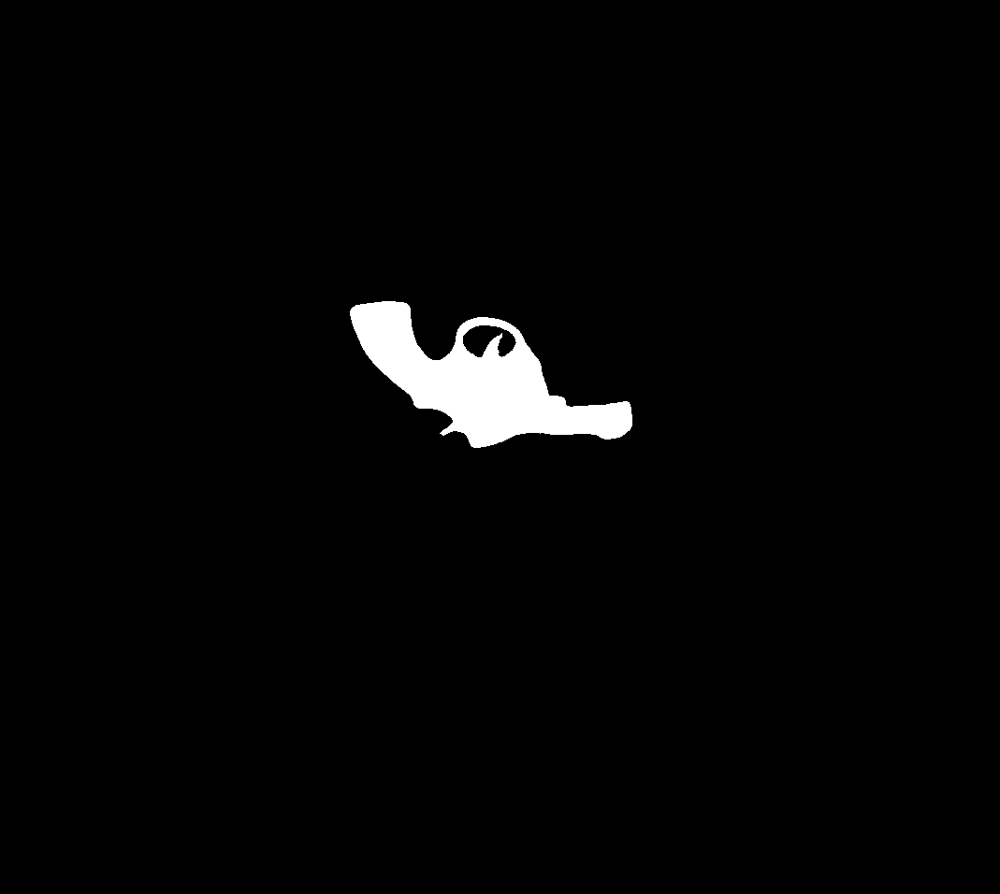

In [82]:
mask_image = Image.fromarray(mask)
mask_image

In [83]:
y_pos, x_pos = center_of_mass(mask)
print(f'{x_pos=}\n{y_pos=}')

x_pos=511.16015077562463
y_pos=407.8784613154207


In [84]:
def plot_overlay_image(cropped_image, overlay, x_pos, y_pos):
    cropped = np.array(cropped_image)
    blended = (cropped * (1 - overlay[..., 3:]) + (overlay * 255).astype(np.uint8)[..., :3] * overlay[..., 3:]).astype(np.uint8)
    overlay_image = Image.fromarray(blended)

    r = 20  # crosshair radius in pixels
    draw = ImageDraw.Draw(overlay_image)
    draw.line([(x_pos - r, y_pos), (x_pos + r, y_pos)], fill=(255, 0, 0), width=4)
    draw.line([(x_pos, y_pos - r), (x_pos, y_pos + r)], fill=(255, 0, 0), width=4)

    return overlay_image

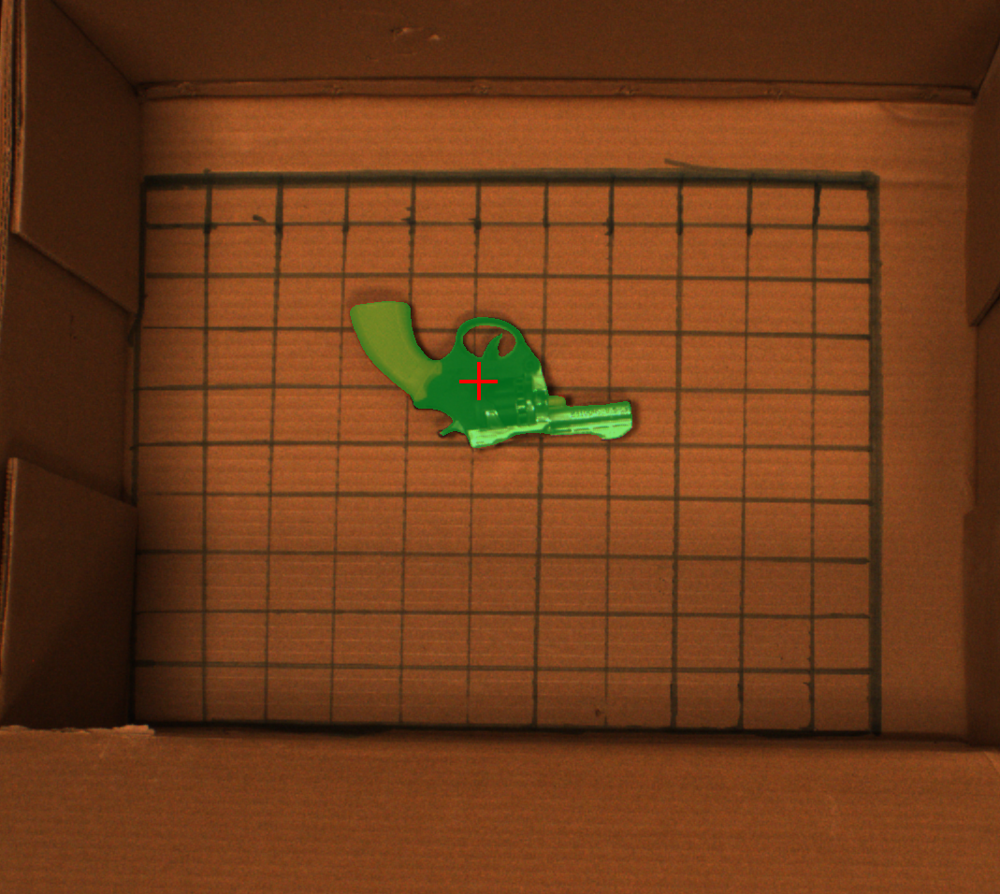

In [85]:
overlay_image = plot_overlay_image(cropped_image, overlay, x_pos, y_pos)
overlay_image

In [ ]:
def process_sample(sample_path):

    # read from sample path
    recovery = np.load(os.path.join(sample_path, "RECOVERY.npz"), allow_pickle=True)
    shifts = recovery["all_shifts"]  # (100, N_frames, 2)
    config = json.load(open(os.path.join(sample_path, "experiment_config.json")))

    # crop the image, segment it, find x position and y position
    raw_image = Image.open(os.path.join(sample_path, "box_overhead_image.png"))
    cropped_image = crop_image(raw_image, left=0.15, right=0.67, up=0.08, down=0.7)
    with app.run():
        mask, overlay = segment.remote(np.array(cropped_image), "circle")
    y_pos, x_pos = center_of_mass(mask)
    overlay_image = plot_overlay_image(cropped_image, overlay, x_pos, y_pos)

    data = {
        "x_position":        x_pos,
        "y_position":        y_pos,
        "object":            config["object"],
        "speakers":          config["speakers"],
        "raw_image":         raw_image,
        "cropped_image":     cropped_image,
        "overlay_image":     overlay_image,
        "fps":               int(config["FPS"]),
        "experiment_config": json.dumps(config),
    }
    return shifts, mask, data

In [90]:
shifts, mask, data = process_sample(sample_path)

FileNotFoundError: [Errno 2] No such file or directory: 'Q:\\mark_sheinin_lab\\DATA\\experiment-09\\gun_1000--29-03-15-09-31\\RECOVERY.npz'

In [87]:
from datasets import Dataset, load_dataset, Image as HFImage
from huggingface_hub import HfApi
import io

IMAGE_COLS = ["raw_image", "cropped_image", "overlay_image"]

def to_webp(img):
    buf = io.BytesIO()
    img.convert("RGB").save(buf, format="WEBP", quality=85)
    return {"bytes": buf.getvalue(), "path": None}

def upload_sample(repo_id, shifts, mask, data):
    api = HfApi()
    api.create_repo(repo_id, repo_type="dataset", exist_ok=True)

    files = list(api.list_repo_files(repo_id, repo_type="dataset"))
    idx = sum(1 for f in files if f.startswith("data/sample_") and f.endswith(".npz"))

    buf = io.BytesIO()
    np.savez_compressed(buf, shifts=shifts, mask=mask)
    buf.seek(0)
    api.upload_file(path_or_fileobj=buf, path_in_repo=f"data/sample_{idx}.npz",
                    repo_id=repo_id, repo_type="dataset")

    row = {**data, "sample_idx": idx, **{col: to_webp(data[col]) for col in IMAGE_COLS}}
    try:
        ds = load_dataset(repo_id, split="train")
        ds = ds.add_item(row)
    except Exception:
        ds = Dataset.from_list([row])
    for col in IMAGE_COLS:
        ds = ds.cast_column(col, HFImage())
    ds.push_to_hub(repo_id)

c:\Users\eitanturok\good-vibrations\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [88]:
upload_sample("eturok-weizmann/vibrations", shifts, mask, data)

NameError: name 'shifts' is not defined

# old 

In [ ]:
def load_sample(idx, cube_path):
    recovery = np.load(os.path.join(cube_path, "RECOVERY.npz"), allow_pickle=True)
    shifts = recovery["all_shifts"]  # (100, N_frames, 2)
    config = json.load(open(os.path.join(cube_path, "experiment_config.json")))
    fps = int(config["FPS"])
    m = re.search(r"cube-(\d+)x-(\d+)y", os.path.basename(cube_path))
    tensors = {f"shifts_{idx}": torch.from_numpy(shifts)}
    meta = {
        "shifts_idx":        idx,
        "raw_image":         Image.open(os.path.join(cube_path, "box_overhead_image.png")),
        "x_position":        int(m.group(1)),
        "y_position":        int(m.group(2)),
        "experiment_config": json.dumps(config),
        "fps":               fps,
        "object":            "cube",
    }
    return tensors, meta

In [ ]:
def drop(img):
    img = np.array(sample["raw_image"].convert("RGB"))
    H, W = img.shape[:2]
    x1, x2 = int(W * 0.31), int(W * 0.62)
    y1, y2 = int(H * 0.25), H
    cropped = img[y1:y2, x1:x2]

In [ ]:
from transformers import pipeline
import transformers.models.sam2.image_processing_sam2_fast as sam2_fast

device = 'mps'
generator = pipeline("mask-generation", model="facebook/sam2.1-hiera-tiny", device=device)

Loading weights:   0%|          | 0/309 [00:00<?, ?it/s]

In [14]:
generator

MaskGenerationPipeline: {'model': 'Sam2Model', 'dtype': 'float32', 'device': 'mps', 'input_modalities': ('image', 'text')}

In [22]:
outputs = generator(img_path, points_per_batch=64, points_per_side=16)
masks = outputs["masks"]
len(masks)# Number of masks generated

KeyboardInterrupt: 

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
def plot_image_with_mask(image_path: str, mask: np.ndarray, alpha: float = 0.5, color: tuple = (1, 0, 0), output_path: str = None):
    image = np.array(Image.open(image_path).convert("RGB"))

    fig, ax = plt.subplots(figsize=(12, 8))
    ax.imshow(image)

    overlay = np.zeros((*mask.shape, 4))
    overlay[mask > 0] = [*color, alpha]
    ax.imshow(overlay)
    ax.axis("off")

    if output_path:
        fig.savefig(output_path, bbox_inches="tight", pad_inches=0, dpi=150)
    plt.show()
    plt.close(fig)

In [18]:
plot_image_with_mask('/tmp/truck.jpg', masks[0], alpha=0.5, color=(1, 0, 0), output_path='tmp/truck_mask.png')

UnidentifiedImageError: cannot identify image file '/tmp/truck.jpg'